<h1> <center> GLOBAL WHEAT DETECTION <center> </h1>

## Team Members 
- Venkata Nitin Reddy Byreddy  (NUID - 002191804 )
- Krithika Madabhooshi         (NUID - 002985169 )
- Kavya Mannem                 (NUID - 002194057 )
- Subbiah Cheranthian          (NUID - 001522751 )

In your regular day, you’re likely to find usage of several wheat products. Indeed, wheat is a mostly relied common grain and its popularity among food and crop makes it widely studied. To get large and accurate data about wheat fields worldwide, plant scientists use image detection of "wheat heads"—spikes atop the plant containing grain. These images are used to estimate the density and size of wheat heads in different varieties. Detection of wheat heads is an important task allowing to estimate pertinent traits including head population density and head characteristics such as sanitary state, size, maturity stage and the presence of awns. However, accurate wheat head detection in outdoor field images can be visually challenging. There is often overlap of dense wheat plants, and the wind can blur the photographs. Both make it difficult to identify single heads. Additionally, appearances vary due to maturity, color, genotype, and head orientation. 

Finally, because wheat is grown worldwide, different varieties, planting densities, patterns, and field conditions must be considered. Models developed for wheat phenotyping need to generalize between different growing environments. We have done Keras implementation of Mask- RCNN for Global Wheat Detection and tried implementing detection methods: one- and two-stage detectors (Yolo-V3 and Faster-RCNN). The Global Wheat Head Dataset is led by nine research institutes from seven countries. Also, these institutions are joined by many in their pursuit of accurate wheat head detection, including the Global Institute for Food Security, DigitAg, Kubota, and Hiphen.

Wheat is a staple across the globe, which is why this dataset accounts for different growing conditions. Models developed for wheat phenotyping need to be able to generalize between environments. With successful implementation of this Wheat Detection, researchers can accurately estimate the density and size of wheat heads in different varieties. With improved detection farmers can better assess their crops, ultimately bringing cereal, toast, and other favorite dishes to your table.

## Problem Statement :
Detecting wheat heads from outdoor images of wheat plants, including wheat datasets from around the globe and help farmers use the data to assess health and maturity when making management decisions in their fields.

## Dataset:
The dataset we have used is https://www.kaggle.com/competitions/global-wheat-detection/data

To better gauge the performance for unseen genotypes, environments, and observational conditions, the training dataset covers multiple regions. You will use more than 3,000 images from Europe (France, UK, Switzerland) and North America (Canada). The test data includes about 1,000 images from Australia, Japan, and China.

In [55]:
## Contents:
### 1. Exploratory data analysis
### 2. Fast-RCNN Model Configuration
### 3. YOLO-V3 Model Configuration
### 4. Mask-RCNN Model Configuration
### 5. Conclusion

### IMPORTING THE REQUIRED MODULES

In [56]:
import numpy as np 
import pandas as pd 
import seaborn as sns
from tqdm import tqdm
import matplotlib.pyplot as plt
import sys, os, random, glob, cv2, math

from mrcnn import utils
from mrcnn.model import log
from mrcnn import visualize
import mrcnn.model as modellib
from mrcnn.config import Config
import os
import re

import torch

from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

from torch.utils.data import DataLoader, Dataset

from matplotlib import pyplot as plt
# Set default figure size
plt.rcParams['figure.figsize'] = (10.0, 10.0)
from absl import logging
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.layers import Add,Concatenate,Conv2D,Input,Lambda,LeakyReLU,MaxPool2D,UpSampling2D,ZeroPadding2D,BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.losses import binary_crossentropy, sparse_categorical_crossentropy
from tensorflow.keras.callbacks import ReduceLROnPlateau,EarlyStopping,ModelCheckpoint,TensorBoard
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping, LearningRateScheduler, CSVLogger
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display
from seaborn import color_palette
import cv2
import pandas as pd
from tqdm import tqdm
import os
import tensorflow as tf
import time
from tqdm import tqdm
import datetime
import ast

Import an image on which the analysis is going to be performed

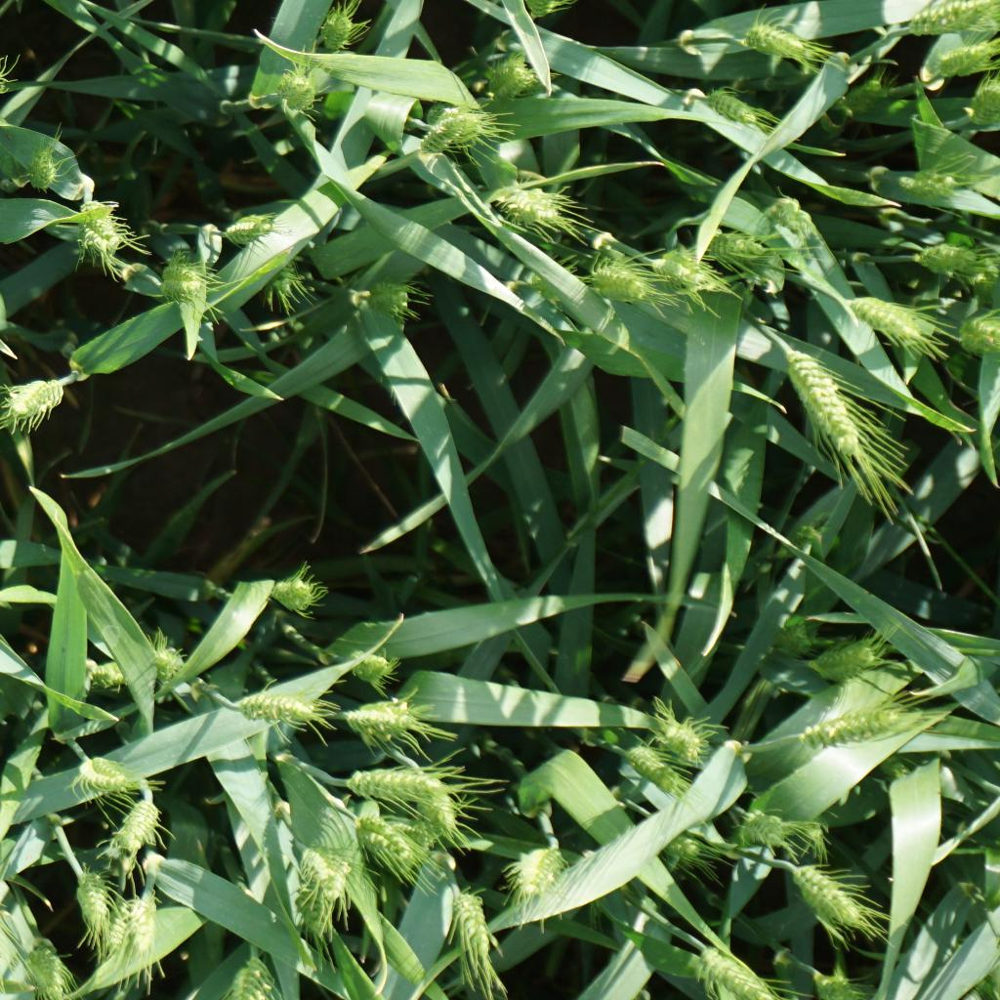

In [57]:
from IPython.display import Image
Image("C:/Users/nitin/OneDrive/Documents/Global Wheat Dataset/train/00ea5e5ee.jpg", width=500)

##  Exploratory Data Analysis

In [58]:
ORIG_SIZE     = 1024
epoch         = 100
data_root     = '/kaggle/input'
packages_root = '/kaggle/working'

Load the annotation files

In [59]:

df = pd.read_csv('C:/Users/nitin/OneDrive/Documents/Global Wheat Dataset/train.csv')
df.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


Information summary of the dataset 

In [60]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147793 entries, 0 to 147792
Data columns (total 5 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   image_id  147793 non-null  object
 1   width     147793 non-null  int64 
 2   height    147793 non-null  int64 
 3   bbox      147793 non-null  object
 4   source    147793 non-null  object
dtypes: int64(2), object(3)
memory usage: 5.6+ MB


### Check source distribution

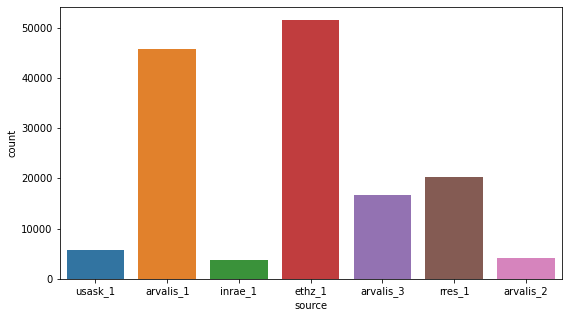

In [61]:
plt.figure(figsize=(9,5))
sns.countplot(df.source)
plt.show()

Organization informed that not all images include wheat heads / bounding boxes. We can justify that easily from the following step. There're about 49 image that doesn't have bbox.

In [62]:
# image directory
img_root = 'C:/Users/nitin/OneDrive/Documents/Global Wheat Dataset/train'
len(os.listdir(img_root)) - len(df.image_id.unique())

49

In [63]:
df['bbox'] = df['bbox'].apply(lambda x: x[1:-1].split(","))

df['x'] = df['bbox'].apply(lambda x: x[0]).astype('float32')
df['y'] = df['bbox'].apply(lambda x: x[1]).astype('float32')
df['w'] = df['bbox'].apply(lambda x: x[2]).astype('float32')
df['h'] = df['bbox'].apply(lambda x: x[3]).astype('float32')

df = df[['image_id','x', 'y', 'w', 'h']]
df.head()

,image_id,x,y,w,h
0,b6ab77fd7,834.0,222.0,56.0,36.0
1,b6ab77fd7,226.0,548.0,130.0,58.0
2,b6ab77fd7,377.0,504.0,74.0,160.0
3,b6ab77fd7,834.0,95.0,109.0,107.0
4,b6ab77fd7,26.0,144.0,124.0,117.0


In [64]:
# Define File Path Constants
INPUT_DIR = os.path.abspath('C:/Users/nitin/OneDrive/Documents/Global Wheat Dataset')
TRAIN_DIR = os.path.join(INPUT_DIR, "train")

# Load and Show Training Labels
pd.read_csv(os.path.join(INPUT_DIR, "train.csv"))

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1
...,...,...,...,...,...
147788,5e0747034,1024,1024,"[64.0, 619.0, 84.0, 95.0]",arvalis_2
147789,5e0747034,1024,1024,"[292.0, 549.0, 107.0, 82.0]",arvalis_2
147790,5e0747034,1024,1024,"[134.0, 228.0, 141.0, 71.0]",arvalis_2
147791,5e0747034,1024,1024,"[430.0, 13.0, 184.0, 79.0]",arvalis_2


In [65]:
# Convenience functions for loading images
def read_image_from_path(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def read_image_from_train_folder(image_id):
    path = os.path.join(TRAIN_DIR, image_id + ".jpg")
    return read_image_from_path(path)

In [66]:
# Functions for parsing bounding box string into x1, y1, x2, y2
def parse_bbox_text(string_input):
    input_without_brackets = re.sub("\[|\]", "", string_input)
    input_as_list = np.array(input_without_brackets.split(","))
    return input_as_list.astype(np.float) 

def xywh_to_x1y1x2y2(x,y,w,h):
    return np.array([x,y,x+w,y+h])

In [67]:
# Parse training bounding box labels
train_df = pd.read_csv(os.path.join(INPUT_DIR, "train.csv"))
bbox_series = train_df.bbox.apply(parse_bbox_text)

xywh_df = pd.DataFrame(bbox_series.to_list(), columns=["x", "y", "w", "h"])

x2_df = pd.DataFrame(xywh_df.x + xywh_df.w, columns=["x2"])
y2_df = pd.DataFrame(xywh_df.y + xywh_df.h, columns=["y2"])

# Update training dataframe with parsed labels
train_df = train_df.join([xywh_df, x2_df, y2_df])
train_df.head()

,image_id,width,height,bbox,source,x,y,w,h,x2,y2
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,834.0,222.0,56.0,36.0,890.0,258.0
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1,226.0,548.0,130.0,58.0,356.0,606.0
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1,377.0,504.0,74.0,160.0,451.0,664.0
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1,834.0,95.0,109.0,107.0,943.0,202.0
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1,26.0,144.0,124.0,117.0,150.0,261.0


In [68]:
# Convenience function for drawing a list of bounding box coordinates on and image
def draw_boxes_on_image(boxes, image, color=(255,0,0)):    
    for box in boxes:
        cv2.rectangle(image,
                      (int(box[0]), int(box[1]) ),
                      (int(box[2]), int(box[3]) ),
                      color, 3)
    return image

In [69]:
# Download a pre-trained bounding box detector
model = fasterrcnn_resnet50_fpn(pretrained=True)
model

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [70]:
# Replace the pre-trained bounding box detector head with
# a new one that predicts our desired 2 classes {BACKGROUND, WHEAT}
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_channels=in_features, num_classes=2)

# Verify the model architecture
model.roi_heads

RoIHeads(
  (box_roi_pool): MultiScaleRoIAlign(featmap_names=['0', '1', '2', '3'], output_size=(7, 7), sampling_ratio=2)
  (box_head): TwoMLPHead(
    (fc6): Linear(in_features=12544, out_features=1024, bias=True)
    (fc7): Linear(in_features=1024, out_features=1024, bias=True)
  )
  (box_predictor): FastRCNNPredictor(
    (cls_score): Linear(in_features=1024, out_features=2, bias=True)
    (bbox_pred): Linear(in_features=1024, out_features=8, bias=True)
  )
)

In [71]:
# Determine device to run on. GPU is highly recommended
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

def move_batch_to_device(images, targets):
    images = list(image.to(device) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    return images, targets

In [72]:
# Split data into training and validation subsets
unique_image_ids = train_df['image_id'].unique()

n_validation = int(0.2 * len(unique_image_ids))
valid_ids = unique_image_ids[-n_validation:]
train_ids = unique_image_ids[:-n_validation]

validation_df = train_df[train_df['image_id'].isin(valid_ids)]
training_df = train_df[train_df['image_id'].isin(train_ids)]

print("%i training samples\n%i validation samples" % (len(training_df.image_id.unique()),len(validation_df.image_id.unique())) )

2699 training samples
674 validation samples


##  YOLO-V3 Model Configuration

In [73]:
yolo_anchors = np.array([(10, 13), (16, 30), (33, 23), (30, 61), (62, 45),
                         (59, 119), (116, 90), (156, 198), (373, 326)],
                        np.float32) / 320
yolo_anchor_masks = np.array([[6, 7, 8], [3, 4, 5], [0, 1, 2]])

size = 320 # size of resize image
batch_size = 8 #Batch size that we want to load when training
yolo_max_boxes = 116 # maximum yolo boxes predicted per image.
yolo_iou_threshold = 0.5 # IOU threshold score 
yolo_score_threshold = 0.4 # objectness threshold score
learning_rate = 1e-4 # learning rate
num_classes = 2 # num of category in our dataset
epochs = 30 # epochs run to fine tune our model
class_dict = {'Wheat':1} # Mapping of category and its corresponding label

In [74]:
def DarknetConv(x, filters, size, strides=1, batch_norm=True):
    if strides == 1: 
        padding = 'same' 
    else:
        x = ZeroPadding2D(((1, 0), (1, 0)))(x)  # top left half-padding 
        padding = 'valid' 
    x = Conv2D(filters=filters, kernel_size=size,
               strides=strides, padding=padding,
               use_bias=not batch_norm, kernel_regularizer=l2(0.0005))(x)
    if batch_norm:
        x = BatchNormalization()(x)
        x = LeakyReLU(alpha=0.1)(x) 
        # by default alpha is 0.3
    return x

In [75]:
# below is residual connection layer function
def DarknetResidual(x, filters):
    prev = x # storing input in prev variable 
    x = DarknetConv(x, filters // 2, 1) 
    x = DarknetConv(x, filters, 3)
    x = Add()([prev, x]) # residual connection
    return x

In [76]:
# this is our real Darknetblock function calling above 2 fucntions 
def DarknetBlock(x, filters, blocks):
    x = DarknetConv(x, filters, 3, strides=2) 
    for _ in range(blocks):
        x = DarknetResidual(x, filters)
    return x

In [77]:
def Darknet(name=None):
    x = inputs = Input([None, None, 3])
    x = DarknetConv(x, 32, 3)
    x = DarknetBlock(x, 64, 1)
    x = DarknetBlock(x, 128, 2)  # skip connection
    x = x_36 = DarknetBlock(x, 256, 8)  # skip connection
    x = x_61 = DarknetBlock(x, 512, 8)
    x = DarknetBlock(x, 1024, 4) # last layer detecting bounding box dimension (tx,ty,bx,by)
    return tf.keras.Model(inputs, (x_36, x_61, x), name=name)

In [78]:
def YoloConv(filters, name=None):
    def yolo_conv(x_in):
        if isinstance(x_in, tuple):
            inputs = Input(x_in[0].shape[1:]), Input(x_in[1].shape[1:])
            x, x_skip = inputs

            # concat with skip connection
            x = DarknetConv(x, filters, 1)
            # upsampling of a layer
            x = UpSampling2D(2)(x)
            # concatenation of skip connection result and last output result
            x = Concatenate()([x, x_skip])
        else:
            x = inputs = Input(x_in.shape[1:])
        
        x = DarknetConv(x, filters, 1)
        x = DarknetConv(x, filters * 2, 3)
        x = DarknetConv(x, filters, 1)
        x = DarknetConv(x, filters * 2, 3)
        x = DarknetConv(x, filters, 1)
        return Model(inputs, x, name=name)(x_in)
    return yolo_conv

In [79]:
def YoloOutput(filters, anchors, classes, name=None):
    def yolo_output(x_in):
        x = inputs = Input(x_in.shape[1:]) # this is an input shape excluded with batch size.
        x = DarknetConv(x, filters * 2, 3) # Darkconv is a fn implemented above which is internally calling
        x = DarknetConv(x, anchors * (classes + 5), 1, batch_norm=False)
        x = Lambda(lambda x: tf.reshape(x, (-1, tf.shape(x)[1], tf.shape(x)[2],
                                            anchors, classes + 5)))(x)
        # x is reshaped into (None, grid_size, grid_size, anchors, (x,y,w,h,objectness score,..classes))
        return tf.keras.Model(inputs, x, name=name)(x_in)
    return yolo_output

In [80]:
def yolo_boxes(pred, anchors, classes):
    # pred: (batch_size, grid, grid, anchors, (x, y, w, h, obj, ...classes))
    grid_size = tf.shape(pred)[1]
    box_xy, box_wh, objectness, class_probs = tf.split(
        pred, (2, 2, 1, classes), axis=-1)
    # objectness : it's means whether there is any object in a predicted box
    # class_probs : it's a probability of a class given object is there i.e P(Pc|object)

    box_xy = tf.sigmoid(box_xy) 
    objectness = tf.sigmoid(objectness)
    class_probs = tf.sigmoid(class_probs)
    pred_box = tf.concat((box_xy, box_wh), axis=-1)  # original xywh for loss

    # !!! grid[x][y] == (y, x)
    grid = tf.meshgrid(tf.range(grid_size), tf.range(grid_size))
    grid = tf.expand_dims(tf.stack(grid, axis=-1), axis=2)  # [gx, gy, 1, 2]
    box_xy = (box_xy + tf.cast(grid, tf.float32)) / \
        tf.cast(grid_size, tf.float32)
    box_wh = tf.exp(box_wh) * anchors

    box_x1y1 = box_xy - box_wh / 2 
    box_x2y2 = box_xy + box_wh / 2
    bbox = tf.concat([box_x1y1, box_x2y2], axis=-1)

    return bbox, objectness, class_probs, pred_box

def yolo_nms(outputs, anchors, masks, classes):
    # boxes, confidence scores(objectness scores), class probabilities

    b, c, t = [], [], []

    # iterating through each outputs predicted by model
    for o in outputs:
        b.append(tf.reshape(o[0], (tf.shape(o[0])[0], -1, tf.shape(o[0])[-1])))
        c.append(tf.reshape(o[1], (tf.shape(o[1])[0], -1, tf.shape(o[1])[-1])))
        t.append(tf.reshape(o[2], (tf.shape(o[2])[0], -1, tf.shape(o[2])[-1])))

    bbox = tf.concat(b, axis=1)
    confidence = tf.concat(c, axis=1)
    class_probs = tf.concat(t, axis=1)

    scores = confidence * class_probs # this is P(Pc|objectness score) value
    boxes, scores, classes, valid_detections = tf.image.combined_non_max_suppression(
        boxes=tf.reshape(bbox, (tf.shape(bbox)[0], -1, 1, 4)),
        scores=tf.reshape(
            scores, (tf.shape(scores)[0], -1, tf.shape(scores)[-1])),
        max_output_size_per_class = yolo_max_boxes, # here it is 223, define above 
        max_total_size = yolo_max_boxes,
        iou_threshold = yolo_iou_threshold, # threshold for filtering the boxes
        score_threshold = yolo_score_threshold # threshold for objectness score below which we ignore that bounding box
    )

    return boxes, scores, classes, valid_detections

In [81]:
def YoloV3(size=None, channels=3, anchors=yolo_anchors,
           masks=yolo_anchor_masks, classes=80, training=False):
    x = inputs = Input([size, size, channels], name='input') # input of an image

    x_36, x_61, x = Darknet(name='yolo_darknet')(x) # backbone networks 3 outputs w.r.t to each grid size
    # till here darknet network

    # from below it's a Feature Pyramind Network with lateral connections
    # for 13*13 grid size output
    x = YoloConv(512, name='yolo_conv_0')(x) 
    output_0 = YoloOutput(512, len(masks[0]), classes, name='yolo_output_0')(x)
    
    # for 26*26 grid size output
    x = YoloConv(256, name='yolo_conv_1')((x, x_61))
    output_1 = YoloOutput(256, len(masks[1]), classes, name='yolo_output_1')(x)

    # for 52*52 grid size output
    x = YoloConv(128, name='yolo_conv_2')((x, x_36))
    output_2 = YoloOutput(128, len(masks[2]), classes, name='yolo_output_2')(x)

    if training:
        return Model(inputs, (output_0, output_1, output_2), name='yolov3')

    # for 13*13 grid size output
    boxes_0 = Lambda(lambda x: yolo_boxes(x, anchors[masks[0]], classes),
                     name='yolo_boxes_0')(output_0)
    # for 26*26 grid size output
    boxes_1 = Lambda(lambda x: yolo_boxes(x, anchors[masks[1]], classes),
                     name='yolo_boxes_1')(output_1)
    # for 52*52 grid size output
    boxes_2 = Lambda(lambda x: yolo_boxes(x, anchors[masks[2]], classes),
                     name='yolo_boxes_2')(output_2)
    #  after combining boxes from various scales we have total 10,647 boxes which is too large
    # so to remove invalid boxes we use non_maximum_suppression 

    outputs = Lambda(lambda x: yolo_nms(x, anchors, masks, classes),
                     name='yolo_nms')((boxes_0[:3], boxes_1[:3], boxes_2[:3]))

    return Model(inputs, outputs, name='yolov3')


In [82]:
def YoloV3(size=None, channels=3, anchors=yolo_anchors,
           masks=yolo_anchor_masks, classes=80, training=False):
    x = inputs = Input([size, size, channels], name='input') # input of an image

    x_36, x_61, x = Darknet(name='yolo_darknet')(x) # backbone networks 3 outputs w.r.t to each grid size
    # till here darknet network

    # from below it's a Feature Pyramind Network with lateral connections
    # for 13*13 grid size output
    x = YoloConv(512, name='yolo_conv_0')(x) 
    output_0 = YoloOutput(512, len(masks[0]), classes, name='yolo_output_0')(x)
    
    # for 26*26 grid size output
    x = YoloConv(256, name='yolo_conv_1')((x, x_61))
    output_1 = YoloOutput(256, len(masks[1]), classes, name='yolo_output_1')(x)

    # for 52*52 grid size output
    x = YoloConv(128, name='yolo_conv_2')((x, x_36))
    output_2 = YoloOutput(128, len(masks[2]), classes, name='yolo_output_2')(x)

    if training:
        return Model(inputs, (output_0, output_1, output_2), name='yolov3')

    # for 13*13 grid size output
    boxes_0 = Lambda(lambda x: yolo_boxes(x, anchors[masks[0]], classes),
                     name='yolo_boxes_0')(output_0)
    # for 26*26 grid size output
    boxes_1 = Lambda(lambda x: yolo_boxes(x, anchors[masks[1]], classes),
                     name='yolo_boxes_1')(output_1)
    # for 52*52 grid size output
    boxes_2 = Lambda(lambda x: yolo_boxes(x, anchors[masks[2]], classes),
                     name='yolo_boxes_2')(output_2)
    #  after combining boxes from various scales we have total 10,647 boxes which is too large
    # so to remove invalid boxes we use non_maximum_suppression 

    outputs = Lambda(lambda x: yolo_nms(x, anchors, masks, classes),
                     name='yolo_nms')((boxes_0[:3], boxes_1[:3], boxes_2[:3]))

    return Model(inputs, outputs, name='yolov3')


In [83]:
def YoloLoss(anchors, classes=80, ignore_thresh=0.5):
    def yolo_loss(y_true, y_pred):
        # 1. transform all pred outputs
        # y_pred: (batch_size, grid, grid, anchors, (x, y, w, h, obj, ...cls))
        pred_box, pred_obj, pred_class, pred_xywh = yolo_boxes(
            y_pred, anchors, classes)
        pred_xy = pred_xywh[..., 0:2]
        pred_wh = pred_xywh[..., 2:4]

        # 2. transform all true outputs
        # y_true: (batch_size, grid, grid, anchors, (x1, y1, x2, y2, obj, cls))
        
        true_box, true_obj, true_class_idx = tf.split(
            y_true, (4, 1, 1), axis=-1) 

        # the above split function split (x1,y1,x2...cls) into (x1,y1),(x2,y2),(obj),(cls)
        # the 4,1,1 is a length at which it split

        true_xy = (true_box[..., 0:2] + true_box[..., 2:4]) / 2 # finding center (Xcen,Ycen)
        true_wh = true_box[..., 2:4] - true_box[..., 0:2] # width and height

        # give higher weights to small boxes
        box_loss_scale = 2 - true_wh[..., 0] * true_wh[..., 1]

        # 3. inverting the pred box equations
        grid_size = tf.shape(y_true)[1]
        grid = tf.meshgrid(tf.range(grid_size), tf.range(grid_size))
        grid = tf.expand_dims(tf.stack(grid, axis=-1), axis=2)
        true_xy = true_xy * tf.cast(grid_size, tf.float32) - \
            tf.cast(grid, tf.float32) # this code snippet giving us at which point each cell is starting and ending
            # in resize image of 416 * 416 
            # suppose there 13*13 = 169 cells , so every cell we will have starting and ending point
        true_wh = tf.math.log(true_wh / anchors) 
        # YOLO doesn’t predict the absolute coordinates of the bounding box’s center
        true_wh = tf.where(tf.math.is_inf(true_wh),
                           tf.zeros_like(true_wh), true_wh)

        # 4. calculate all masks
        obj_mask = tf.squeeze(true_obj, -1)
        
        # ignore false positive when iou is over threshold
        best_iou = tf.map_fn(
            lambda x: tf.reduce_max(broadcast_iou(x[0], tf.boolean_mask(
                x[1], tf.cast(x[2], tf.bool))), axis=-1),
            (pred_box, true_box, obj_mask),
            tf.float32)
        ignore_mask = tf.cast(best_iou < ignore_thresh, tf.float32)

        # 5. calculate all losses
        xy_loss = obj_mask * box_loss_scale * \
            tf.reduce_sum(tf.square(true_xy - pred_xy), axis=-1)
        wh_loss = obj_mask * box_loss_scale * \
            tf.reduce_sum(tf.square(true_wh - pred_wh), axis=-1)
        
        obj_loss = binary_crossentropy(true_obj, pred_obj)
        # obj_loss = obj_mask * obj_loss + \
        #     (1 - obj_mask) * ignore_mask * obj_loss
        
        alpha = 0.75 # focal loss hyperparameter
        conf_focal = tf.pow(obj_mask-tf.squeeze(tf.sigmoid(pred_obj),-1),2)
        obj_loss = conf_focal*((1-alpha)*obj_mask*obj_loss + alpha*(1-obj_mask)*ignore_mask*obj_loss)  # batch * grid * grid * anchors_per_scale

        # TODO: use binary_crossentropy instead
        class_loss = obj_mask * sparse_categorical_crossentropy(
            true_class_idx, pred_class)

        # 6. sum over (batch, gridx, gridy, anchors) => (batch, 1)
        xy_loss = tf.reduce_sum(xy_loss, axis=(1, 2, 3))
        wh_loss = tf.reduce_sum(wh_loss, axis=(1, 2, 3))
        obj_loss = tf.reduce_sum(obj_loss, axis=(1, 2, 3))
        class_loss = tf.reduce_sum(class_loss, axis=(1, 2, 3))

        return xy_loss + wh_loss + obj_loss + class_loss
    return yolo_loss

In [84]:
YOLOV3_LAYER_LIST = ['yolo_darknet','yolo_conv_0','yolo_output_0','yolo_conv_1',
                     'yolo_output_1','yolo_conv_2','yolo_output_2',]

def load_darknet_weights(model, weights_file, tiny=False):
    wf = open(weights_file, 'rb') # reading weights file
    major, minor, revision, seen, _ = np.fromfile(wf, dtype=np.int32, count=5)

    layers = YOLOV3_LAYER_LIST

    # iterating through all layers define in above yolov3_layers_list
    for layer_name in layers:
        # for eg if there is one layer darknet then there is many sub layers inside it's network
        sub_model = model.get_layer(layer_name)
        for i, layer in enumerate(sub_model.layers):
            if not layer.name.startswith('conv2d'): 
                continue
            batch_norm = None
            if i + 1 < len(sub_model.layers) and \
                    sub_model.layers[i + 1].name.startswith('batch_norm'):
                batch_norm = sub_model.layers[i + 1]

            logging.info("{}/{} {}".format(
                sub_model.name, layer.name, 'bn' if batch_norm else 'bias'))

            filters = layer.filters
            size = layer.kernel_size[0]
            in_dim = layer.input_shape[-1]

            if batch_norm is None:
                conv_bias = np.fromfile(wf, dtype=np.float32, count=filters)
            else:
                # darknet [beta, gamma, mean, variance]
                bn_weights = np.fromfile(
                    wf, dtype=np.float32, count=4 * filters)
                # tf [gamma, beta, mean, variance]
                bn_weights = bn_weights.reshape((4, filters))[[1, 0, 2, 3]]

            # darknet shape (out_dim, in_dim, height, width)
            conv_shape = (filters, in_dim, size, size)
            conv_weights = np.fromfile(
                wf, dtype=np.float32, count=np.product(conv_shape))
            # tf shape (height, width, in_dim, out_dim)
            conv_weights = conv_weights.reshape(
                conv_shape).transpose([2, 3, 1, 0])

            if batch_norm is None:
                layer.set_weights([conv_weights, conv_bias])
            else:
                layer.set_weights([conv_weights])
                batch_norm.set_weights(bn_weights)

    assert len(wf.read()) == 0, 'failed to read all data'
    wf.close()



def broadcast_iou(box_1, box_2):
    # box_1: (..., (x1, y1, x2, y2))
    # box_2: (N, (x1, y1, x2, y2))

    # broadcast boxes
    box_1 = tf.expand_dims(box_1, -2)
    box_2 = tf.expand_dims(box_2, 0)
    # new_shape: (..., N, (x1, y1, x2, y2))
    new_shape = tf.broadcast_dynamic_shape(tf.shape(box_1), tf.shape(box_2))
    box_1 = tf.broadcast_to(box_1, new_shape) # it will change the shape of box into new_shape given
    box_2 = tf.broadcast_to(box_2, new_shape)

    # in below code we are finding intersection box width and height through which we will find intersection area.
    # and this we are finding all boxes 
    int_w = tf.maximum(tf.minimum(box_1[..., 2], box_2[..., 2]) -
                       tf.maximum(box_1[..., 0], box_2[..., 0]), 0) 
    int_h = tf.maximum(tf.minimum(box_1[..., 3], box_2[..., 3]) -
                       tf.maximum(box_1[..., 1], box_2[..., 1]), 0) 
    int_area = int_w * int_h  # area of intersection
    box_1_area = (box_1[..., 2] - box_1[..., 0]) * \
        (box_1[..., 3] - box_1[..., 1]) # this box_1_area contains all boxes area predicted in an image
    box_2_area = (box_2[..., 2] - box_2[..., 0]) * \
        (box_2[..., 3] - box_2[..., 1]) # this box2_area is our ground truth box area

    # Formula: Union(A,B) = A + B - Inter(A,B)
    return int_area / (box_1_area + box_2_area - int_area)


def freeze_all(model, frozen=True):
    model.trainable = not frozen
    if isinstance(model, tf.keras.Model):
        for l in model.layers:
            freeze_all(l, frozen)


In [85]:
@tf.function
def transform_targets_for_output(y_true, grid_size, anchor_idxs):
    # y_true: (N, boxes, (x1, y1, x2, y2, class, best_anchor))
    N = tf.shape(y_true)[0]

    # y_true_out: (N, grid, grid, anchors, [x, y, w, h, obj, class])
    y_true_out = tf.zeros(
        (N, grid_size, grid_size, tf.shape(anchor_idxs)[0], 6))

    anchor_idxs = tf.cast(anchor_idxs, tf.int32)

    indexes = tf.TensorArray(tf.int32, 1, dynamic_size=True)
    updates = tf.TensorArray(tf.float32, 1, dynamic_size=True)
    idx = 0

    # below iteration change the values and update it to the format which acceptable by yolov3.
    for i in tf.range(N):
        for j in tf.range(tf.shape(y_true)[1]):
            if tf.equal(y_true[i][j][2], 0): 
                continue
            anchor_eq = tf.equal(
                anchor_idxs, tf.cast(y_true[i][j][5], tf.int32))

            if tf.reduce_any(anchor_eq):
                box = y_true[i][j][0:4] #(x1,y1,x2,y2)
                box_xy = (y_true[i][j][0:2] + y_true[i][j][2:4]) / 2 # ((x1+x2)/2,(y1+y2)/2)

                # which is (Xcenter,Ycenter)

                anchor_idx = tf.cast(tf.where(anchor_eq), tf.int32)
                grid_xy = tf.cast(box_xy // (1/grid_size), tf.int32) # multiplying it by grid_size

                # grid[y][x][anchor] = (tx, ty, bw, bh, obj, class)
                indexes = indexes.write(
                    idx, [i, grid_xy[1], grid_xy[0], anchor_idx[0][0]]) 
                updates = updates.write(
                    idx, [box[0], box[1], box[2], box[3], 1, y_true[i][j][4]])
                idx += 1
    return tf.tensor_scatter_nd_update(
        y_true_out, indexes.stack(), updates.stack())

In [86]:
def transform_targets(y_train, anchors, anchor_masks, size):
    y_outs = []
    grid_size = size // 32 # suppose we input 416 size then grid size is 416//32 = 13

    # calculate anchor index for true boxes
    anchors = tf.cast(anchors, tf.float32) # casting every anchors to float
    anchor_area = anchors[..., 0] * anchors[..., 1] # calculating the area of anchors
    box_wh = y_train[..., 2:4] - y_train[..., 0:2] # here we are peforming xmax-xmin,ymax-ymin using vectors
    box_wh = tf.tile(tf.expand_dims(box_wh, -2),
                     (1, 1, tf.shape(anchors)[0], 1))
    box_area = box_wh[..., 0] * box_wh[..., 1] # these are our Ground Truth Box Area
    intersection = tf.minimum(box_wh[..., 0], anchors[..., 0]) * \
        tf.minimum(box_wh[..., 1], anchors[..., 1]) # here we tring to get IOU area 
    iou = intersection / (box_area + anchor_area - intersection) # simple operation of Intersection/Union
    anchor_idx = tf.cast(tf.argmax(iou, axis=-1), tf.float32) # storing those anchor index which has highest IOU number
    anchor_idx = tf.expand_dims(anchor_idx, axis=-1)

    y_train = tf.concat([y_train, anchor_idx], axis=-1)

    for anchor_idxs in anchor_masks:
        y_outs.append(transform_targets_for_output(
            y_train, grid_size, anchor_idxs))
        grid_size *= 2 # here we are calling the above function for 13*13 grid then, 26*26 grid then, 52*52 grid.

    return tuple(y_outs)


In [87]:
%%time
yolo = YoloV3(classes=80)
yolo.summary()

Model: "yolov3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, None, None,  0                                            
__________________________________________________________________________________________________
yolo_darknet (Model)            ((None, None, None,  40620640    input[0][0]                      
__________________________________________________________________________________________________
yolo_conv_0 (Model)             (None, None, None, 5 11024384    yolo_darknet[1][2]               
__________________________________________________________________________________________________
yolo_conv_1 (Model)             (None, None, None, 2 2957312     yolo_conv_0[1][0]                
                                                                 yolo_darknet[1][1]          

## Mask-RCNN Model Configuration

In [88]:
class WheatDetectorConfig(Config):
    # Give the configuration a recognizable name  
    NAME = 'wheat'
    
    # set the number of GPUs to use along with the number of images
    # per GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 2
    BACKBONE = 'resnet101'
    
    # number of classes (we would normally add +1 for the background)
    # BG + Wheat
    NUM_CLASSES = 2
    
    IMAGE_RESIZE_MODE = "square"
    IMAGE_MIN_DIM = 1024
    IMAGE_MAX_DIM = 1024
    
    # Number of training steps per epoch
    STEPS_PER_EPOCH = 120
    
    # Use different size anchors because our target objects are multi-scale (wheats are some too big, some too small)
    RPN_ANCHOR_SCALES = (16, 32, 64, 128, 256)  # anchor side in pixels
    BACKBONE_STRIDES = [4, 8, 16, 32, 64]
    
    # Learning rate
    LEARNING_RATE = 0.005
    WEIGHT_DECAY  = 0.0005
    
    # Maximum number of ROI’s, the Region Proposal Network (RPN) will generate for the image
    TRAIN_ROIS_PER_IMAGE = 350 
    
    # Skip detections with < 60% confidence
    DETECTION_MIN_CONFIDENCE = 0.60
    
    # Increase with larger training
    VALIDATION_STEPS = 60
    
    # Maximum number of instances that can be detected in one image.
    MAX_GT_INSTANCES = 500 # 200 
 
    # Loss weights for more precise optimization.
    # Can be used for R-CNN training setup.
    LOSS_WEIGHTS = {
        "rpn_class_loss": 1.0,
        "rpn_bbox_loss": 1.0,
        "mrcnn_class_loss": 1.0,
        "mrcnn_bbox_loss": 1.0,
        "mrcnn_mask_loss": 1.0
        }

config = WheatDetectorConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.6
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  1024
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.005
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE        

## Data Preparing

In [89]:
def get_jpg(img_dir, anns):
    '''
    input:
        img_dir: image directory of the train sets
        anns: specified image ids for train or validation
    return:
        img files with specified image ids
    '''
    id      = []
    jpg_fps = []

    for index, row in anns.iterrows():
        id.append(row['image_id'])

    for i in os.listdir(img_dir):
        if os.path.splitext(i)[0] not in id:
            continue
        else:
            jpg_fps.append(os.path.join(img_dir, i))

    return list(set(jpg_fps))

def get_dataset(img_dir, anns): 
    image_fps = get_jpg(img_dir, anns)

    image_annotations = {fp: [] for fp in image_fps}

    for index, row in anns.iterrows(): 
        fp = os.path.join(img_dir, row['image_id'] + '.jpg')
        image_annotations[fp].append(row)

    return image_fps, image_annotations

## Data Generator for Mask-RCNN

In [90]:
class DetectorDataset(utils.Dataset):
    def __init__(self, image_fps, image_annotations, orig_height, orig_width):
        super().__init__(self)
        
        # Add classes
        self.add_class('GlobalWheat', 1 , 'Wheat') # only one class, wheat
        
        # add images 
        for id, fp in enumerate(image_fps):
            annotations = image_annotations[fp]
            self.add_image('GlobalWheat', image_id=id, 
                           path=fp, annotations=annotations, 
                           orig_height=orig_height, orig_width=orig_width)

    # load bbox, most important function so far        
    def load_mask(self, image_id):
        info = self.image_info[image_id]
        annotations = info['annotations']
        count = len(annotations)
    
        if count == 0:
            mask = np.zeros((info['orig_height'], info['orig_width'], 1), 
                            dtype=np.uint8)
            class_ids = np.zeros((1,), dtype=np.int32)
        else:
            mask = np.zeros((info['orig_height'], info['orig_width'], count),
                            dtype=np.uint8)
            class_ids = np.zeros((count,), dtype=np.int32)
            for i, a in enumerate(annotations):
                x = int(a['x'])
                y = int(a['y'])
                w = int(a['w'])
                h = int(a['h'])
                mask_instance = mask[:, :, i].copy()
                cv2.rectangle(mask_instance, (x, y), (x+w, y+h), 255, -1)
                mask[:, :, i] = mask_instance
                class_ids[i] = 1
        return mask.astype(np.bool), class_ids.astype(np.int32)
    
    # simple image loader 
    def load_image(self, image_id):
        info = self.image_info[image_id]
        fp = info['path']
        image = cv2.imread(fp, cv2.IMREAD_COLOR)
        # If grayscale. Convert to RGB for consistency.
        if len(image.shape) != 3 or image.shape[2] != 3:
            image = np.stack((image,) * 3, -1)
        return image
    
    # simply return the image path
    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path']

## Splits Data Sets 

In [91]:
image_ids = df['image_id'].unique()

valid_ids = image_ids[-700:]
train_ids = image_ids[:-700]

valid_df = df[df['image_id'].isin(valid_ids)]
train_df = df[df['image_id'].isin(train_ids)]
train_df.shape, valid_df.shape

((122106, 5), (25687, 5))

In [92]:
len(train_df.image_id.unique()), len(valid_df.image_id.unique())

(2673, 700)

## Build Train Set

In [93]:
# grab all image file path with concern annotation
train_image_fps, train_image_annotations = get_dataset(img_root,
                                                       anns=train_df)

# make data generator with that
dataset_train = DetectorDataset(train_image_fps, 
                                train_image_annotations,
                                ORIG_SIZE, ORIG_SIZE)
dataset_train.prepare()

print("Class Count: {}".format(dataset_train.num_classes))
for i, info in enumerate(dataset_train.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Class Count: 2
  0. BG                                                
  1. Wheat                                             


## Build Validation Set

In [94]:
# grab all image file path with concern annotation
valid_image_fps, valid_image_annotations = get_dataset(img_root, 
                                           anns=valid_df)

# make data generator with that
dataset_valid = DetectorDataset(valid_image_fps, valid_image_annotations,
                                ORIG_SIZE, ORIG_SIZE)
dataset_valid.prepare()

print("Class Count: {}".format(dataset_valid.num_classes))
for i, info in enumerate(dataset_valid.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Class Count: 2
  0. BG                                                
  1. Wheat                                             


## Training Samples

Using dataset_train, let's observe some sample data.

(1024, 1024, 3)
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


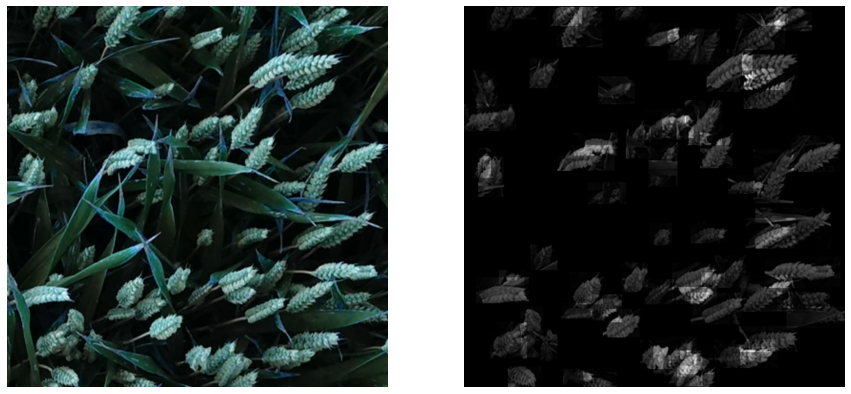

In [95]:
class_ids = [0]

while class_ids[0] == 0:  ## look for a mask
    image_id = random.choice(dataset_train.image_ids)
    image_fp = dataset_train.image_reference(image_id)
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)

print(image.shape)

plt.figure(figsize=(15, 15))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 2, 2)
masked = np.zeros(image.shape[:2])
for i in range(mask.shape[2]):
    masked += image[:, :, 0] * mask[:, :, i]
plt.imshow(masked, cmap='gray')
plt.axis('off')

print(class_ids)
plt.show()

## Top Mask Position


Let's display some sample and corresponding mask here (which is bounding box indicator).

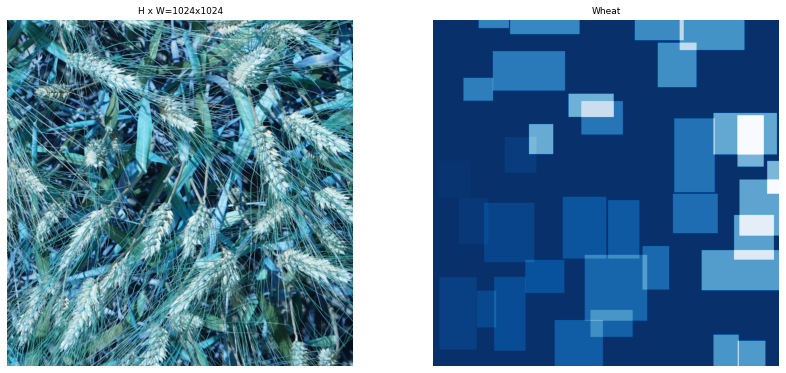

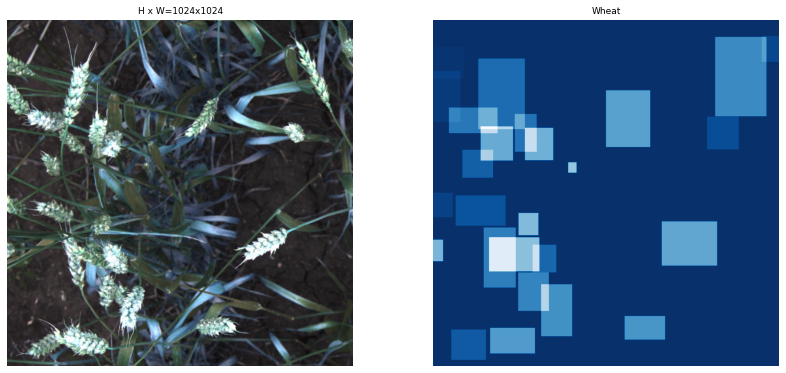

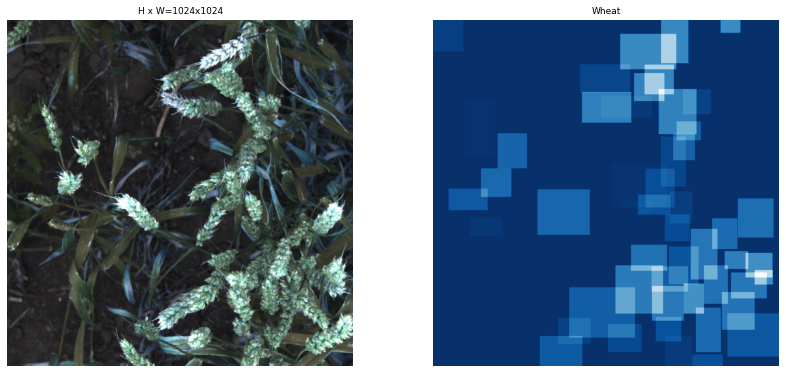

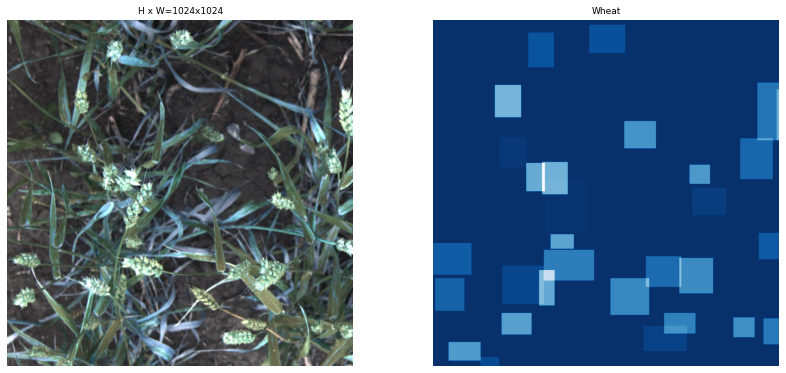

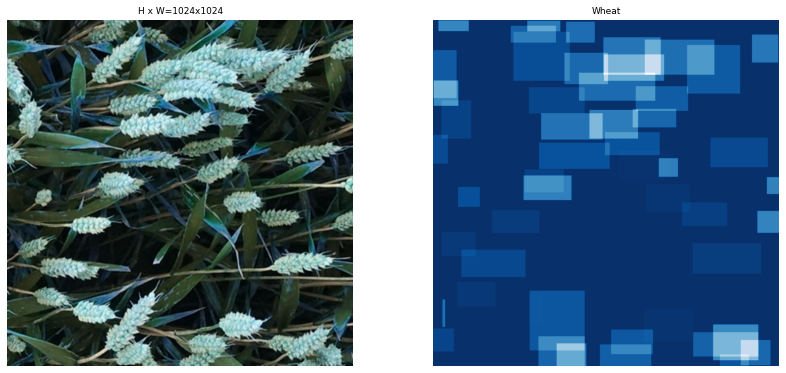

In [96]:
# Load and display random samples
image_ids = np.random.choice(dataset_train.image_ids,5)
for image_id in image_ids:
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, 
                                dataset_train.class_names, limit=1)

## BBoxes with Masked Sample 


In Mask-RCNN, the aspect ratio is preserved, though. If an image is not square, then zero padding is added at the top/bottom or right/left.

Original shape:  (1024, 1024, 3)
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
mask                     shape: (1024, 1024, 40)      min:    0.00000  max:    1.00000  bool
class_ids                shape: (40,)                 min:    1.00000  max:    1.00000  int32
bbox                     shape: (40, 4)               min:    0.00000  max: 1024.00000  int32


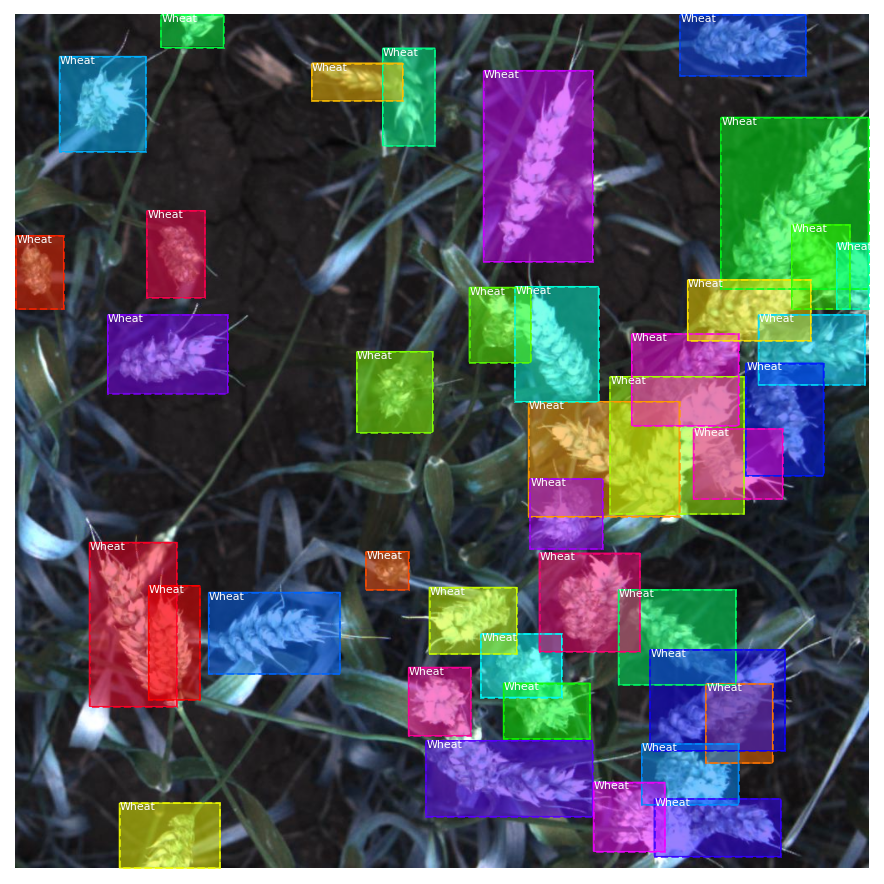

In [97]:
# Load random image and mask.
image_id = np.random.choice(dataset_train.image_ids, 1)[0]
image = dataset_train.load_image(image_id)
mask, class_ids = dataset_train.load_mask(image_id)
original_shape = image.shape

# Resize
image, window, scale, padding, _ = utils.resize_image(image, 
                                                      min_dim=config.IMAGE_MIN_DIM, 
                                                      max_dim=config.IMAGE_MAX_DIM,
                                                      mode=config.IMAGE_RESIZE_MODE)
mask = utils.resize_mask(mask, scale, padding)

# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("Original shape: ", original_shape)
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)

# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, 
                            dataset_train.class_names)


## Augmentation


Augmentation is the key part to boost performance. Here are some weather looking augmentation which are implemented using img_aug library.
- Cutout + CoarseDropout
- Snowflakes
- Rain

In [98]:
!pip install C:/Users/nitin/Downloads/rcnn/Mask_RCNN/imgaug-0.4.0-py2.py3-none-any.whl -q

In [99]:
import warnings
from imgaug import augmenters as iaa
warnings.filterwarnings("ignore")

augmentation = iaa.Sequential([
        iaa.OneOf([ ## rotate
            iaa.Affine(rotate=0),
            iaa.Affine(rotate=90),
            iaa.Affine(rotate=180),
            iaa.Affine(rotate=270),
        ]),

        iaa.Fliplr(0.5),
        iaa.Flipud(0.2),

        iaa.OneOf([ # drop out augmentation
            iaa.Cutout(fill_mode="constant", cval=255),
            iaa.CoarseDropout((0.0, 0.05), size_percent=(0.02, 0.25)),
            ]),

        iaa.OneOf([ ## weather augmentation
            iaa.Snowflakes(flake_size=(0.2, 0.4), speed=(0.01, 0.07)),
            iaa.Rain(speed=(0.3, 0.5)),
        ]),  

        iaa.OneOf([ ## brightness or contrast
            iaa.Multiply((0.8, 1.0)),
            iaa.contrast.LinearContrast((0.9, 1.1)),
        ]),

        iaa.OneOf([ ## blur or sharpen
            iaa.GaussianBlur(sigma=(0.0, 0.1)),
            iaa.Sharpen(alpha=(0.0, 0.1)),
        ])
    ],
    # do all of the above augmentations in random order
    random_order=True
)


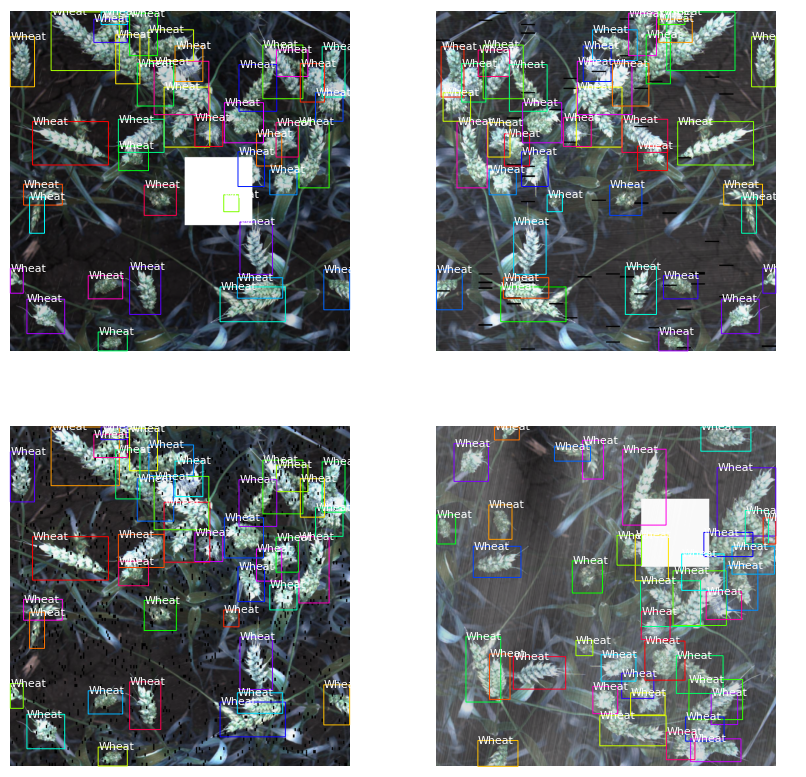

In [100]:
# from official repo
def get_ax(rows=1, cols=1, size=7):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax


# Load the image multiple times to show augmentations
limit = 4
ax = get_ax(rows=2, cols=limit//2)

for i in range(limit):
    image, image_meta, class_ids,\
    bbox, mask = modellib.load_image_gt(
        dataset_train, config, image_id, use_mini_mask=False, 
        augment=False, augmentation=augmentation)
    
    visualize.display_instances(image, bbox, mask, class_ids,
                                dataset_train.class_names, ax=ax[i//2, i % 2],
                                show_mask=False, show_bbox=False)


## Build Model 


Time to build the model. We have used mask_rcnn_coco.h5 pre-trained model and train the model by initializing with it.

In [101]:
def model_definition():
    print("loading mask R-CNN model")
    model = modellib.MaskRCNN(mode='training', 
                              config=config, 
                              model_dir=packages_root)
    
    # load the weights for COCO
    model.load_weights('C:/Users/nitin/Downloads/rcnn/Mask_RCNN/mask_rcnn_coco.h5',
                       by_name=True, 
                       exclude=["mrcnn_class_logits",
                                "mrcnn_bbox_fc",  
                                "mrcnn_bbox","mrcnn_mask"])
    return model   

model = model_definition()

loading mask R-CNN model


In [102]:
from keras.callbacks import (ModelCheckpoint, ReduceLROnPlateau, CSVLogger)

def callback():
    cb = []
    checkpoint = ModelCheckpoint(packages_root+'wheat_wg.h5',
                                 save_best_only=True,
                                 mode='min',
                                 monitor='val_loss',
                                 save_weights_only=True, verbose=1)
    cb.append(checkpoint)
    reduceLROnPlat = ReduceLROnPlateau(monitor='val_loss',
                                   factor=0.3, patience=5,
                                   verbose=1, mode='auto',
                                   epsilon=0.0001, cooldown=1, min_lr=0.00001)
    log = CSVLogger(packages_root+'wheat_history.csv')
    cb.append(log)
    cb.append(reduceLROnPlat)
    return cb

In [103]:
%%time
CB = callback()
TRAIN = False

class WheatInferenceConfig(WheatDetectorConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

if TRAIN:
    model.train(dataset_train, dataset_valid, 
                augmentation=augmentation, 
                learning_rate=config.LEARNING_RATE,
                custom_callbacks = CB,
                epochs=epoch, layers='all') 
else:
    inference_config = WheatInferenceConfig()
    # Recreate the model in inference mode
    model = modellib.MaskRCNN(mode='inference', 
                              config=inference_config,
                              model_dir=packages_root)
    
    model.load_weights('C:/Users/nitin/Downloads/rcnn/Mask_RCNN/wheat_096269_101_1024.h5', 
                       by_name = True)


Wall time: 7.27 s


## Learning Curves

In [104]:
history = pd.read_csv('C:/Users/nitin/OneDrive/Documents/Global Wheat Dataset/wheat_history.csv') 

# find the lowest validation loss score
print(history.loc[history['val_loss'].idxmin()])
history.head()

epoch                   77.000000
loss                     1.097748
mrcnn_bbox_loss          0.232579
mrcnn_class_loss         0.271902
mrcnn_mask_loss          0.299718
rpn_bbox_loss            0.248904
rpn_class_loss           0.044611
val_loss                 1.016543
val_mrcnn_bbox_loss      0.225225
val_mrcnn_class_loss     0.246011
val_mrcnn_mask_loss      0.293907
val_rpn_bbox_loss        0.205175
val_rpn_class_loss       0.046190
Name: 77, dtype: float64


,epoch,loss,mrcnn_bbox_loss,mrcnn_class_loss,mrcnn_mask_loss,rpn_bbox_loss,rpn_class_loss,val_loss,val_mrcnn_bbox_loss,val_mrcnn_class_loss,val_mrcnn_mask_loss,val_rpn_bbox_loss,val_rpn_class_loss
0,0,1.793012,0.396198,0.400109,0.431264,0.429807,0.135600,1.610578,0.309193,0.331686,0.333010,0.482381,0.154273
1,1,1.301321,0.274120,0.328374,0.336091,0.299777,0.062925,1.419602,0.278529,0.364511,0.311159,0.347890,0.117479
2,2,1.216575,0.257206,0.307851,0.323561,0.280012,0.047911,1.360175,0.291734,0.368800,0.320734,0.282121,0.096751
3,3,1.160110,0.240599,0.299956,0.316172,0.254732,0.048616,1.447964,0.306521,0.394653,0.325209,0.311028,0.110518
4,4,1.104426,0.229990,0.283899,0.310955,0.239217,0.040332,1.476106,0.316820,0.378452,0.324366,0.342224,0.114210


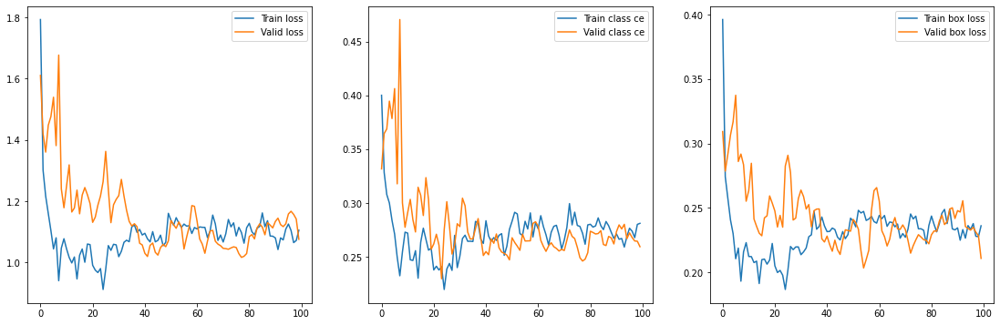

In [105]:
plt.figure(figsize=(19,6))

plt.subplot(131)
plt.plot(history.epoch, history.loss, label="Train loss")
plt.plot(history.epoch, history.val_loss, label="Valid loss")
plt.legend()

plt.subplot(132)
plt.plot(history.epoch, history.mrcnn_class_loss, label="Train class ce")
plt.plot(history.epoch, history.val_mrcnn_class_loss, label="Valid class ce")
plt.legend()

plt.subplot(133)
plt.plot(history.epoch, history.mrcnn_bbox_loss, label="Train box loss")
plt.plot(history.epoch, history.val_mrcnn_bbox_loss, label="Valid box loss")
plt.legend()

plt.show()

## Evaluation 
We will be evaluating the model performance in both ways: visual interpretation and numerical or mainly competition metrices (mAP(0.5:0.75:0.05). But, in most of the cases visual interpretation doesn't really matter (except in medical domain).

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.17695  max:    1.11439  float32
image_meta               shape: (14,)                 min:    0.00000  max: 1024.00000  int32
gt_class_id              shape: (57,)                 min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (57, 4)               min:    0.00000  max: 1024.00000  int32
gt_mask                  shape: (1024, 1024, 57)      min:    0.00000  max:    1.00000  bool
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas    

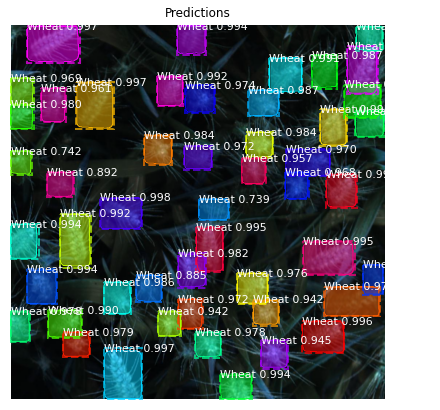

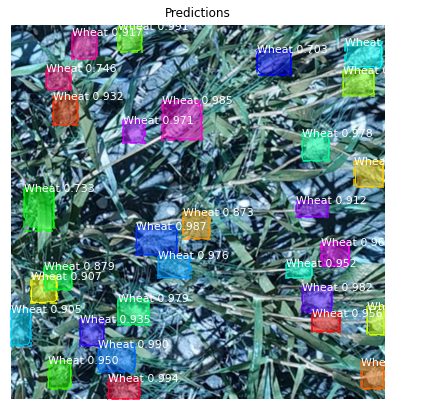

In [106]:
image_id = np.random.choice(dataset_valid.image_ids, 2)

for img_id in image_id:
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_valid, inference_config,     
                               img_id, use_mini_mask=False)

    info = dataset_valid.image_info[img_id]
    results = model.detect([original_image], verbose=1)
    r = results[0]

    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                                dataset_valid.class_names, r['scores'], ax=get_ax(), title="Predictions")
    
    log("image_meta", image_meta)
    log("gt_class_id", gt_class_id)
    log("gt_bbox", gt_bbox)
    log("gt_mask", gt_mask)

## Inference on Test Set 

In [107]:
def get_jpg(img_dir):
    jpg_fps = glob.glob(img_dir + '*.jpg')
    return list(set(jpg_fps))

# Get filenames of test dataset jpg images
test_img_root  = 'C:/Users/nitin/OneDrive/Documents/Global Wheat Dataset/test/'
test_image_fps = get_jpg(test_img_root)

## Visual Prediction

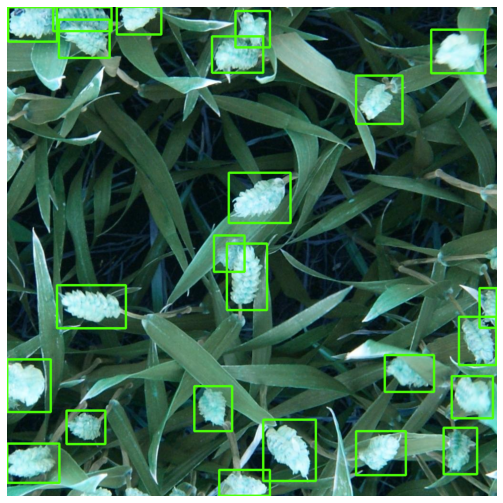

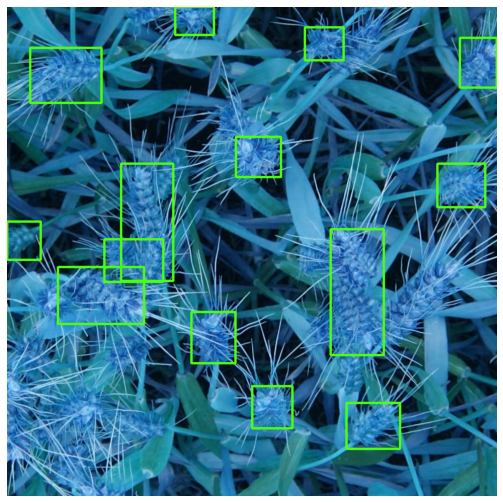

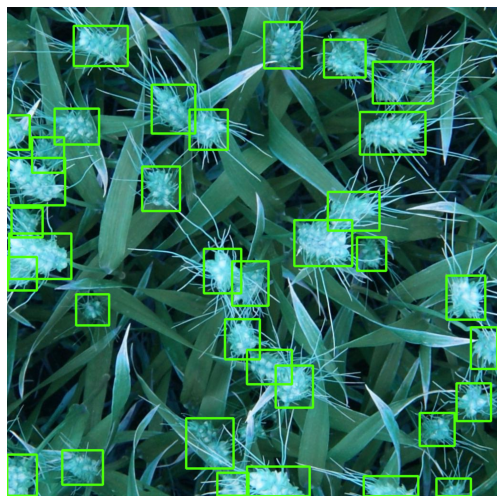

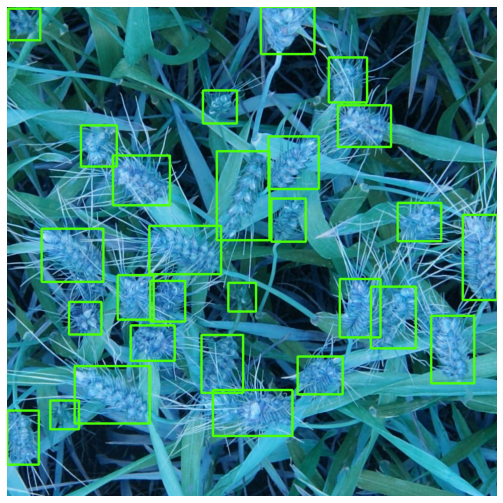

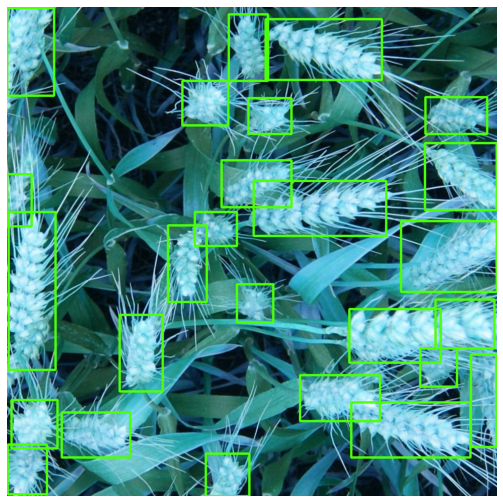

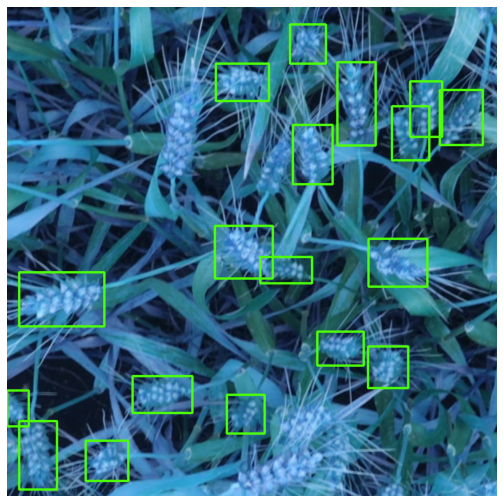

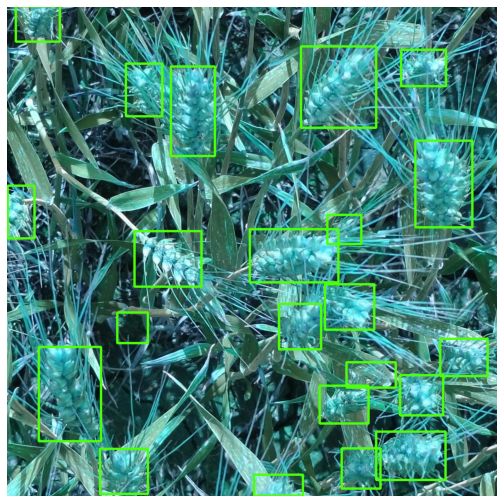

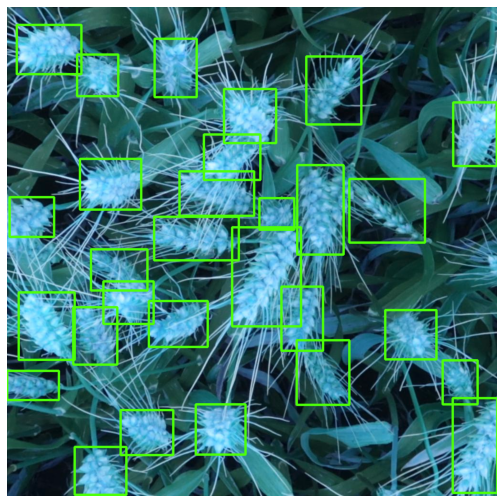

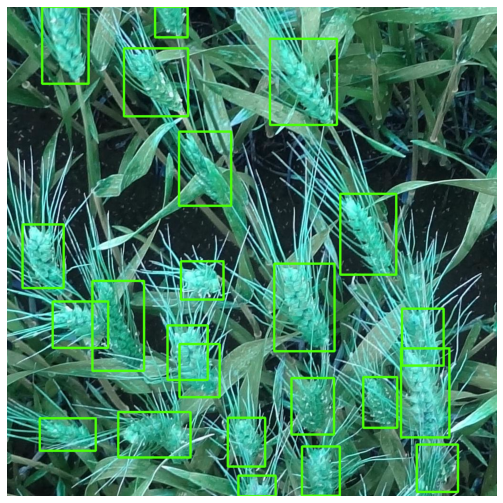

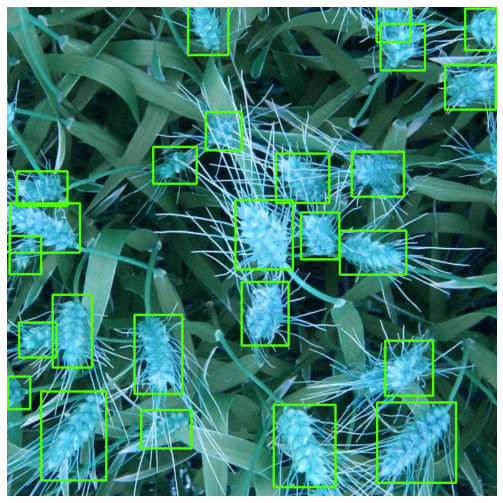

In [108]:
# show a few test image detection example
for image_id in test_image_fps:
    image = cv2.imread(image_id, cv2.IMREAD_COLOR)

    # assume square image 
    resize_factor = ORIG_SIZE / config.IMAGE_SHAPE[0]

    # If grayscale. Convert to RGB for consistency.
    if len(image.shape) != 3 or image.shape[2] != 3:
        image = np.stack((image,) * 3, -1) 

    resized_image, window, scale, padding, crop = utils.resize_image(
        image,
        min_dim=config.IMAGE_MIN_DIM,
        min_scale=config.IMAGE_MIN_SCALE,
        max_dim=config.IMAGE_MAX_DIM,
        mode=config.IMAGE_RESIZE_MODE)

    image_id = os.path.splitext(os.path.basename(image_id))[0]

    results = model.detect([resized_image])
    r = results[0]
    for bbox in r['rois']: 
        x1 = int(bbox[1] * resize_factor)
        y1 = int(bbox[0] * resize_factor)
        x2 = int(bbox[3] * resize_factor)
        y2 = int(bbox[2] * resize_factor)
        cv2.rectangle(image, (x1,y1), (x2,y2), (77, 255, 9), 3, 1)
        width  = x2 - x1 
        height = y2 - y1 

    plt.figure(figsize=(25,9)) 
    plt.grid(False)
    plt.axis('off')
    plt.imshow(image)
    plt.savefig(f"{image_id}.png", bbox_inches='tight', dpi=500)

## References:
•	https://viso.ai/deep-learning/mask-r-cnn/
•	https://github.com/DhruvMakwana/Global-Wheat-Detection/blob/master/Global_Wheat_Detection_EDA.ipynb
•	https://www.youtube.com/watch?v=cpSa0WMAkzY&list=LL&index=1&t=1444s
•	https://jonathan-hui.medium.com/image-segmentation-with-mask-r-cnn-ebe6d793272
•	https://alittlepain833.medium.com/simple-understanding-of-mask-rcnn-134b5b330e95
•	https://medium.com/@selfouly/part-2-fast-r-cnn-object-detection-7303e1988464
•	https://medium.com/mlearning-ai/object-detection-explained-faster-r-cnn-23e7ab57991d
•	https://docs.ultralytics.com/
•	https://medium.com/axinc-ai/yolov5-the-latest-model-for-object-detection-b13320ec516b
•	https://www.youtube.com/watch?v=80Q3HIBy7Qg&t=438s


## Conclusion:
We have put together the Global Wheat Head Detection dataset, a large and varied dataset of wheat head photos, to enhance the precision and dependability of wheat head detection and localisation. As a result of its ease of training, Masked RCNN was shown to be the best model for detecting the wheat head. When compared to Faster RCNN and YOLOv3, Masked RCNN has a lower overhead and has pixel-to-pixel alignment.